## Bibliotecas


In [1]:
%pip install pandas
%pip install plotly
%pip install numpy
%pip install matplotlib
%pip install scikit-learn
%pip install statsmodels
%pip install prophet
%pip install joblib


Note: you may need to restart the kernel to use updated packages.

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [1]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import sklearn as sk
from pandas import to_datetime, date_range
from prophet import Prophet
from sklearn.metrics import mean_squared_error
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
import joblib
import nbformat as nbf
from nbconvert import PythonExporter

## Importação da base

In [3]:
df_anp=pd.read_csv("ipeadata[07-05-2024-09-41].csv", sep=";")

## Conhecendo a base

In [4]:
df_anp.head()

,Data,Preço - petróleo bruto - Brent (FOB) - US$ - Energy Information Administration (EIA) - EIA366_PBRENT366,Unnamed: 2
0,20/05/1987,"18,63",NaN
1,21/05/1987,"18,45",NaN
2,22/05/1987,"18,55",NaN
3,23/05/1987,NaN,NaN
4,24/05/1987,NaN,NaN


In [5]:
df_anp.tail()

,Data,Preço - petróleo bruto - Brent (FOB) - US$ - Energy Information Administration (EIA) - EIA366_PBRENT366,Unnamed: 2
13490,25/04/2024,"88,1",NaN
13491,26/04/2024,"89,95",NaN
13492,27/04/2024,NaN,NaN
13493,28/04/2024,NaN,NaN
13494,29/04/2024,"88,44",NaN


In [6]:
df_anp.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13495 entries, 0 to 13494
Data columns (total 3 columns):
 #   Column                                                                                                   Non-Null Count  Dtype  
---  ------                                                                                                   --------------  -----  
 0   Data                                                                                                     13495 non-null  object 
 1   Preço - petróleo bruto - Brent (FOB) - US$ - Energy Information Administration (EIA) - EIA366_PBRENT366  11160 non-null  object 
 2   Unnamed: 2                                                                                               0 non-null      float64
dtypes: float64(1), object(2)
memory usage: 316.4+ KB


In [7]:
tamanho=df_anp.shape #tamanho do dataframe
tamanho

(13495, 3)

In [8]:
df_anp.isnull().sum() #verificando se há valores nulos

Data                                                                                                           0
Preço - petróleo bruto - Brent (FOB) - US$ - Energy Information Administration (EIA) - EIA366_PBRENT366     2335
Unnamed: 2                                                                                                 13495
dtype: int64

## Tratando a base

In [9]:
# Removendo coluna Unnamed: 2
df_anp = df_anp.drop(columns=["Unnamed: 2"])

In [10]:
#transformando a coluna data em datetime
df_anp['Data'] = pd.to_datetime(df_anp['Data'], format='%d/%m/%Y')
df_anp["Preço - petróleo bruto - Brent (FOB) - US$ - Energy Information Administration (EIA) - EIA366_PBRENT366"] = df_anp["Preço - petróleo bruto - Brent (FOB) - US$ - Energy Information Administration (EIA) - EIA366_PBRENT366"].str.replace(',', '.').astype('float64')


In [11]:
#separando a data em dia, mês e ano
df_anp['Dia'] = df_anp['Data'].dt.day
df_anp['Mês'] = df_anp['Data'].dt.month
df_anp['Ano'] = df_anp['Data'].dt.year

In [12]:
df_anp.head()

,Data,Preço - petróleo bruto - Brent (FOB) - US$ - Energy Information Administration (EIA) - EIA366_PBRENT366,Dia,Mês,Ano
0,1987-05-20,18.63,20,5,1987
1,1987-05-21,18.45,21,5,1987
2,1987-05-22,18.55,22,5,1987
3,1987-05-23,NaN,23,5,1987
4,1987-05-24,NaN,24,5,1987


In [13]:
# Renomeando colunas
df_anp.rename(columns=
              {'Preço - petróleo bruto - Brent (FOB) - US$ - Energy Information Administration (EIA) - EIA366_PBRENT366' : 'Preço petróleo Brent'
               }, inplace=True)

In [14]:
df_anp.head()

,Data,Preço petróleo Brent,Dia,Mês,Ano
0,1987-05-20,18.63,20,5,1987
1,1987-05-21,18.45,21,5,1987
2,1987-05-22,18.55,22,5,1987
3,1987-05-23,NaN,23,5,1987
4,1987-05-24,NaN,24,5,1987


In [15]:
#ordenando_colunas
df_anp = df_anp[['Data', 'Dia', 'Mês', 'Ano','Preço petróleo Brent']]

In [16]:
#verificando o resultado
df_anp.head()

,Data,Dia,Mês,Ano,Preço petróleo Brent
0,1987-05-20,20,5,1987,18.63
1,1987-05-21,21,5,1987,18.45
2,1987-05-22,22,5,1987,18.55
3,1987-05-23,23,5,1987,NaN
4,1987-05-24,24,5,1987,NaN


In [17]:
#confirmando os tipos de dados após as transformações
df_anp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13495 entries, 0 to 13494
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Data                  13495 non-null  datetime64[ns]
 1   Dia                   13495 non-null  int32         
 2   Mês                   13495 non-null  int32         
 3   Ano                   13495 non-null  int32         
 4   Preço petróleo Brent  11160 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int32(3)
memory usage: 369.1 KB


In [18]:
df_anp.isnull().sum()

Data                       0
Dia                        0
Mês                        0
Ano                        0
Preço petróleo Brent    2335
dtype: int64

In [19]:
df_anp = df_anp.dropna() 
# Atenção: # removendo valores nulos(constatei que são em sua grande maioria sabado e domingo, dias sem cotação)

In [20]:
df_anp.isnull().sum()

Data                    0
Dia                     0
Mês                     0
Ano                     0
Preço petróleo Brent    0
dtype: int64

In [21]:
#substituindo as vírgulas por ponto e convertendo a coluna Preço petróleo Brent para float
#df_anp['Preço petróleo Brent'] = df_anp['Preço petróleo Brent'].str.replace(',', '.').astype('float64')
#df_anp['Preço petróleo Brent'] = df_anp['Preço petróleo Brent'].astype('float64')

## Nova análise dos dados

In [22]:
df_anp.head()

,Data,Dia,Mês,Ano,Preço petróleo Brent
0,1987-05-20,20,5,1987,18.63
1,1987-05-21,21,5,1987,18.45
2,1987-05-22,22,5,1987,18.55
5,1987-05-25,25,5,1987,18.60
6,1987-05-26,26,5,1987,18.63


In [23]:
df_anp.to_csv('df_anp.csv', index=False)

In [24]:
#agruapando por ano e mês e calculando a média do preço do petróleo Brent
df_anp.groupby(['Ano', 'Mês'])['Preço petróleo Brent'].describe()


count       mean       std    min      25%     50%      75%    max
Ano  Mês                                                                    
1987 5      8.0  18.580000  0.058554  18.45  18.5725  18.600  18.6075  18.63
     6     21.0  18.860476  0.170777  18.65  18.7500  18.780  19.0500  19.15
     7     23.0  19.856522  0.454049  18.98  19.4900  19.830  20.2400  20.63
     8     21.0  18.979524  0.926129  17.48  18.2800  18.850  19.5000  20.95
     9     22.0  18.313182  0.289077  17.60  18.1800  18.415  18.4950  18.68
...         ...        ...       ...    ...      ...     ...      ...    ...
2023 12    20.0  77.761000  2.411215  74.11  75.8925  77.925  79.9225  81.10
2024 1     22.0  80.124091  2.605123  75.47  78.3475  80.180  82.1225  84.14
     2     21.0  83.478095  1.871194  79.30  83.0100  84.080  84.7200  85.84
     3     20.0  85.408500  1.068187  83.44  84.8575  85.580  86.1725  87.36
     4     20.0  90.023500  1.815614  87.30  88.3275  90.135  91.5100  93.12

[444 rows x 8 columns]

In [25]:
#agrupando por ano e dando um describe no preço do petróleo Brent
#conseguimos ver a média, desvio padrão, mínimo, máximo, quartis
df_anp.groupby('Ano')['Preço petróleo Brent'].describe().head()

,count,mean,std,min,25%,50%,75%,max
Ano,,,,,,,,
1987,160.0,18.525813,0.977190,15.03,17.8875,18.600,19.0350,20.95
1988,255.0,14.905412,1.468460,11.20,13.9800,15.130,16.1400,17.95
1989,254.0,18.228228,1.221591,16.05,17.1850,18.100,19.0725,22.25
1990,256.0,23.761445,7.742344,14.68,17.0950,20.565,30.4700,41.45
1991,257.0,20.041128,1.945543,17.60,18.7500,19.700,20.7500,30.28


In [26]:
#agrupando por mês e dando um describe no preço do petróleo Brent
#conseguimos ver a média, desvio padrão, mínimo, máximo, quartis
df_anp.groupby('Mês')['Preço petróleo Brent'].describe().head()

,count,mean,std,min,25%,50%,75%,max
Mês,,,,,,,,
1,933.0,51.041104,31.136147,10.30,21.880,46.230,75.18,115.55
2,873.0,51.885727,32.839025,9.77,20.080,47.230,71.58,124.89
3,951.0,53.338065,34.940294,10.41,19.545,50.140,76.94,133.18
4,902.0,54.356220,35.181171,9.12,19.950,50.695,83.01,126.59
5,925.0,54.295200,34.850428,13.81,19.700,48.910,74.75,129.72


In [27]:
#agrupando por ano e calculando a média do preço do petróleo Brent
#podemos identificar o maior e menor preço médio do petróleo Brent
df_anp["Preço petróleo Brent"] = pd.to_numeric(df_anp["Preço petróleo Brent"], errors='coerce')
df_anp.groupby(['Ano'])['Preço petróleo Brent'].mean().round(2).head()

Ano
1987    18.53
1988    14.91
1989    18.23
1990    23.76
1991    20.04
Name: Preço petróleo Brent, dtype: float64

In [28]:
#agrupando por mês e calculando a média do preço do petróleo Brent
#podemos identificar o mês com maior e menor preço médio do petróleo Brent
df_anp.groupby(['Mês'])['Preço petróleo Brent'].mean().round(2).head()

Mês
1    51.04
2    51.89
3    53.34
4    54.36
5    54.30
Name: Preço petróleo Brent, dtype: float64

## Gráficos

In [29]:
df_anp.head()

,Data,Dia,Mês,Ano,Preço petróleo Brent
0,1987-05-20,20,5,1987,18.63
1,1987-05-21,21,5,1987,18.45
2,1987-05-22,22,5,1987,18.55
5,1987-05-25,25,5,1987,18.60
6,1987-05-26,26,5,1987,18.63


In [30]:
df_anp_index = df_anp.set_index('Data') # definindo a coluna Data como índice
df_anp_index.drop(columns=['Dia', 'Mês', 'Ano'], inplace=True) # removendo as colunas Dia, Mês e Ano
df_anp_index.head()

,Preço petróleo Brent
Data,
1987-05-20,18.63
1987-05-21,18.45
1987-05-22,18.55
1987-05-25,18.60
1987-05-26,18.63


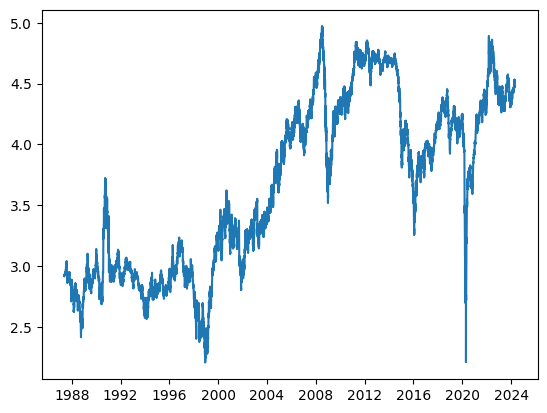

In [31]:
df_anp_index_logScale = np.log(df_anp_index) # aplicando o logaritmo natural
plt.plot(df_anp_index_logScale)


In [32]:
#plotando o gráfico de linha com o preço do petróleo Brent
px.line(df_anp, x='Data', y='Preço petróleo Brent', title='Preço do petróleo Brent',
         labels={'Preço petróleo Brent': 'Preço do petróleo Brent (US$)'})


##ESTUDAR AS CAUSAS QUE LEVARAM A ALTA DO PREÇO DO PETRÓLEO EM 2008, 2011, 2012 E 2022

In [33]:
#plotando o gráfico de linha com o preço médio do petróleo Brent por mês
df_anp_mean=df_anp.groupby(['Mês'])['Preço petróleo Brent'].mean().round(2)
fig=px.line(df_anp_mean, x=df_anp_mean.index, y='Preço petróleo Brent', title='Preço do petróleo Brent por mês',
        labels={'Preço petróleo Brent': 'Preço do petróleo Brent (US$)'})
fig.update_xaxes(tickmode = 'linear', tick0 = 1, dtick = 1)
fig.show()

##ESTUDAR AS CAUSAS QUE LEVARAM A ALTA DO PREÇO DO PETRÓLEO EM MAIO, JUNHO E JULHO

In [34]:

fig=px.box(df_anp, x='Mês', y='Preço petróleo Brent', title='Preço do petróleo Brent por mês', color='Mês')
fig.update_layout(xaxis_title='Mês', yaxis_title='Preço do petróleo Brent (US$)', showlegend=False)
fig.update_xaxes(tickmode = 'linear', tick0 = 1, dtick = 1)
fig.show()

## Machine Learning

### Prophet - teste inicial (modelo-1)


In [35]:
df_anp.head()


,Data,Dia,Mês,Ano,Preço petróleo Brent
0,1987-05-20,20,5,1987,18.63
1,1987-05-21,21,5,1987,18.45
2,1987-05-22,22,5,1987,18.55
5,1987-05-25,25,5,1987,18.60
6,1987-05-26,26,5,1987,18.63


In [36]:
df_anp.tail()

,Data,Dia,Mês,Ano,Preço petróleo Brent
13488,2024-04-23,23,4,2024,88.29
13489,2024-04-24,24,4,2024,89.02
13490,2024-04-25,25,4,2024,88.10
13491,2024-04-26,26,4,2024,89.95
13494,2024-04-29,29,4,2024,88.44


In [37]:
df_anp_prophet = df_anp[['Data', 'Preço petróleo Brent']]
df_anp_prophet.head()

,Data,Preço petróleo Brent
0,1987-05-20,18.63
1,1987-05-21,18.45
2,1987-05-22,18.55
5,1987-05-25,18.60
6,1987-05-26,18.63


In [38]:
df_anp_prophet.rename(columns={"Data": "ds", "Preço petróleo Brent": "y"}, inplace=True) # renomeando as colunas
df_anp_prophet.head()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_17500\3862025937.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ds,y
0,1987-05-20,18.63
1,1987-05-21,18.45
2,1987-05-22,18.55
5,1987-05-25,18.60
6,1987-05-26,18.63


In [39]:
df_anp_prophet.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11160 entries, 0 to 13494
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      11160 non-null  datetime64[ns]
 1   y       11160 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 261.6 KB


In [40]:
m = Prophet(changepoint_prior_scale=0.08, seasonality_prior_scale=0.08, seasonality_mode= "multiplicative", changepoint_range=0.95 ) # instanciando o modelo e testando hiperparâmetros
m.fit(df_anp_prophet) # treinando o modelo

08:28:36 - cmdstanpy - INFO - Chain [1] start processing
08:29:01 - cmdstanpy - INFO - Chain [1] done processing


In [41]:
future = m.make_future_dataframe(periods=90) # criando um dataframe com 365 dias no futuro
future.tail()

,ds
11245,2024-07-24
11246,2024-07-25
11247,2024-07-26
11248,2024-07-27
11249,2024-07-28


In [42]:
forecast = m.predict(future) # realizando a previsão
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail() # visualizando as previsões

,ds,yhat,yhat_lower,yhat_upper
11245,2024-07-24,82.823461,73.415431,92.638764
11246,2024-07-25,82.861444,72.719219,92.807446
11247,2024-07-26,82.760513,73.065658,92.131990
11248,2024-07-27,82.323465,72.342567,92.689095
11249,2024-07-28,82.370559,71.994794,91.371210


c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



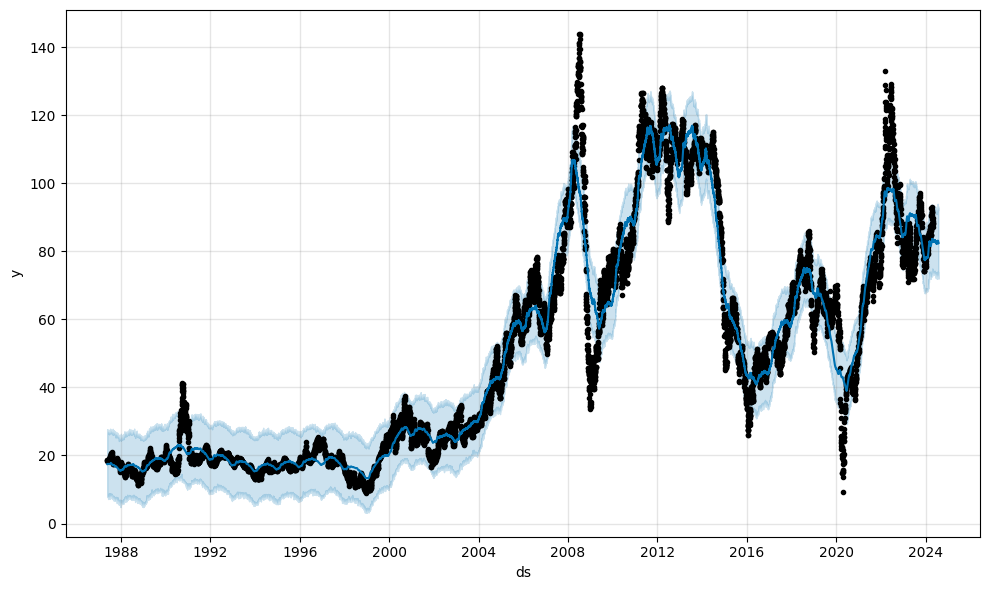

In [43]:
fig1 = m.plot(forecast) # plotando o gráfico


c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:351: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:354: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array

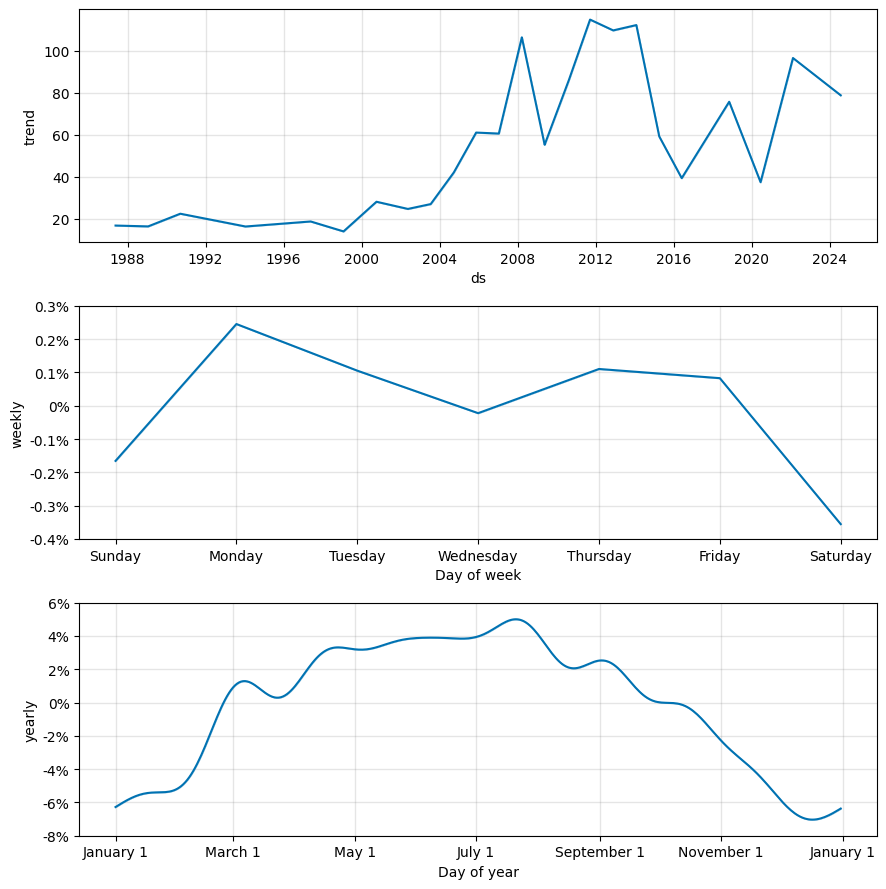

In [44]:
fig2 = m.plot_components(forecast) # plotando os componentes

In [45]:
from prophet.plot import plot_plotly, plot_components_plotly # importando as funções plot_plotly e plot_components_plotly

plot_plotly(m, forecast)

### Avaliando o Modelo (modelo-1)

In [46]:
df_anp_prophet = cross_validation(m, initial='1460, days', period='365 days', horizon = '90 days') # validação cruzada


  0%|          | 0/33 [00:00<?, ?it/s]

08:29:12 - cmdstanpy - INFO - Chain [1] start processing
08:29:14 - cmdstanpy - INFO - Chain [1] done processing
08:29:15 - cmdstanpy - INFO - Chain [1] start processing
08:29:17 - cmdstanpy - INFO - Chain [1] done processing
08:29:18 - cmdstanpy - INFO - Chain [1] start processing
08:29:22 - cmdstanpy - INFO - Chain [1] done processing
08:29:23 - cmdstanpy - INFO - Chain [1] start processing
08:29:25 - cmdstanpy - INFO - Chain [1] done processing
08:29:26 - cmdstanpy - INFO - Chain [1] start processing
08:29:28 - cmdstanpy - INFO - Chain [1] done processing
08:29:29 - cmdstanpy - INFO - Chain [1] start processing
08:29:31 - cmdstanpy - INFO - Chain [1] done processing
08:29:31 - cmdstanpy - INFO - Chain [1] start processing
08:29:32 - cmdstanpy - INFO - Chain [1] done processing
08:29:33 - cmdstanpy - INFO - Chain [1] start processing
08:29:34 - cmdstanpy - INFO - Chain [1] done processing
08:29:35 - cmdstanpy - INFO - Chain [1] start processing
08:29:37 - cmdstanpy - INFO - Chain [1]

In [47]:
df_anp_prophet.head() # visualizando as previsões

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,1992-02-10,17.280106,15.921922,18.758352,18.95,1992-02-07
1,1992-02-11,17.235275,15.761951,18.673481,18.48,1992-02-07
2,1992-02-12,17.201494,15.669595,18.688375,18.33,1992-02-07
3,1992-02-13,17.223144,15.853483,18.722028,18.53,1992-02-07
4,1992-02-14,17.192865,15.737716,18.662452,18.63,1992-02-07


In [48]:
df_anp_prophet.loc[df_anp_prophet["ds"] >= "2022-01-01"] # visualizando a previsão para o partir do dia 01/01/2022

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
2309,2022-01-31,72.245389,61.578221,82.197785,92.35,2022-01-30
2310,2022-02-01,72.249192,61.777890,82.029011,90.24,2022-01-30
2311,2022-02-02,72.248517,62.434314,82.527207,91.43,2022-01-30
2312,2022-02-03,72.538956,62.156082,83.268820,92.99,2022-01-30
2313,2022-02-04,72.521769,62.464758,83.512366,96.86,2022-01-30
...,...,...,...,...,...,...
2493,2024-04-23,89.066419,78.231577,100.041479,88.29,2024-01-30
2494,2024-04-24,88.959033,79.240546,99.601415,89.02,2024-01-30
2495,2024-04-25,89.056934,78.072936,100.103648,88.10,2024-01-30
2496,2024-04-26,89.024039,78.222199,99.147334,89.95,2024-01-30


In [49]:
#cutoffs = pd.to_datetime(['2022-01-03', '2022-07-03', '2023-01-03']) # não é necessário ajustar as datas de corte, pois o cross_validation já faz isso
#df_anp_prophet_cutoffs = cross_validation(m, cutoffs=cutoffs, horizon='365 days')

# Podemos tentar melhorar o modelo ajustando os hiperparâmetros (ajustando as datas de corte)

In [50]:
#df_anp_prophet_cutoffs.head() # realizando a validação cruzada com os cortes

In [51]:
performance = performance_metrics(df_anp_prophet) 
performance.head() # visualizando as métricas

##ATENÇÃO: O MODELO DEVE SER AVALIADO, SE NÃO ESTIVER BOM, DEVE SER AJUSTADO
# Verificar se oresultado das metricas está bom, se não, tentar melhorar o modelo

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,9 days,99.609176,9.980440,6.415488,0.109130,0.075132,0.110404,0.629778
1,10 days,101.848091,10.091982,6.503804,0.110978,0.075457,0.112965,0.632817
2,11 days,102.550979,10.126746,6.528306,0.111464,0.078577,0.113793,0.626506
3,12 days,101.970726,10.098056,6.498740,0.111162,0.078577,0.113648,0.629451
4,13 days,98.900043,9.944850,6.383857,0.110248,0.080536,0.112835,0.635728


c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:546: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:547: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



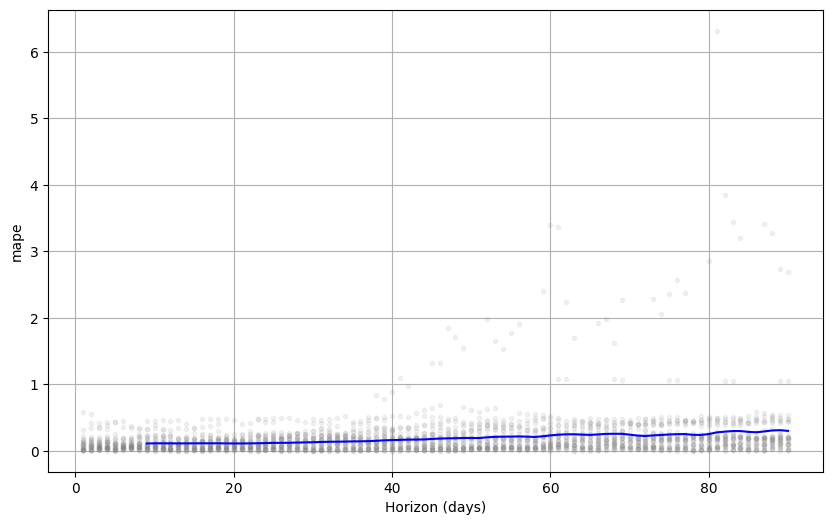

In [52]:
fig = plot_cross_validation_metric(df_anp_prophet, metric='mape', rolling_window=0.1) # plotando o gráfico


### Prophet - testando o modelo com uma base menor (10 anos) (modelo-2)

In [53]:
df_anp.tail()

,Data,Dia,Mês,Ano,Preço petróleo Brent
13488,2024-04-23,23,4,2024,88.29
13489,2024-04-24,24,4,2024,89.02
13490,2024-04-25,25,4,2024,88.10
13491,2024-04-26,26,4,2024,89.95
13494,2024-04-29,29,4,2024,88.44


In [54]:
df_anp_range_10_anos = df_anp[(df_anp['Data'] >= '2014-04-29')]# selecionando o intervalo de 10 anos
df_anp_range_10_anos.head()

,Data,Dia,Mês,Ano,Preço petróleo Brent
9841,2014-04-29,29,4,2014,109.53
9842,2014-04-30,30,4,2014,108.63
9843,2014-05-01,1,5,2014,108.63
9844,2014-05-02,2,5,2014,109.12
9845,2014-05-03,3,5,2014,109.89


In [55]:
df_anp_range_10_anos_prophet = df_anp_range_10_anos[['Data', 'Preço petróleo Brent']] # selecionando as colunas Data e Preço petróleo Brent
df_anp_range_10_anos_prophet.head()

,Data,Preço petróleo Brent
9841,2014-04-29,109.53
9842,2014-04-30,108.63
9843,2014-05-01,108.63
9844,2014-05-02,109.12
9845,2014-05-03,109.89


In [56]:
df_anp_range_10_anos_prophet.rename(columns={"Data":"ds", "Preço petróleo Brent":"y"}, inplace=True) # renomeando as colunas
df_anp_range_10_anos_prophet.head()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_17500\2068926842.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ds,y
9841,2014-04-29,109.53
9842,2014-04-30,108.63
9843,2014-05-01,108.63
9844,2014-05-02,109.12
9845,2014-05-03,109.89


In [57]:
m2 = Prophet(changepoint_prior_scale=0.08, seasonality_prior_scale=0.08, seasonality_mode= "multiplicative", changepoint_range=0.95 )
m2.fit(df_anp_range_10_anos_prophet)

08:33:25 - cmdstanpy - INFO - Chain [1] start processing
08:33:27 - cmdstanpy - INFO - Chain [1] done processing


In [58]:
future2 = m2.make_future_dataframe(periods=30) # criando um dataframe com 90 dias no futuro (pode ser alterado para tentar uma previsão melhor)
future2.tail()

,ds
3043,2024-05-25
3044,2024-05-26
3045,2024-05-27
3046,2024-05-28
3047,2024-05-29


In [59]:
forecast2 = m2.predict(future2)
forecast2[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].to_csv("forecast2.csv")
forecast2[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]


,ds,yhat,yhat_lower,yhat_upper
0,2014-04-29,114.272373,106.702450,122.580975
1,2014-04-30,113.741531,105.861722,120.951121
2,2014-05-01,113.480094,105.947605,120.930519
3,2014-05-02,113.667809,105.448089,121.539720
4,2014-05-03,112.646488,104.755814,119.991585
...,...,...,...,...
3043,2024-05-25,91.371697,83.418265,99.115761
3044,2024-05-26,92.102837,84.410004,99.962243
3045,2024-05-27,92.362276,84.656392,100.284067
3046,2024-05-28,92.355297,84.233194,99.547416


c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



Text(83.34722222222221, 0.5, 'Preço do petróleo Brent (US$)')

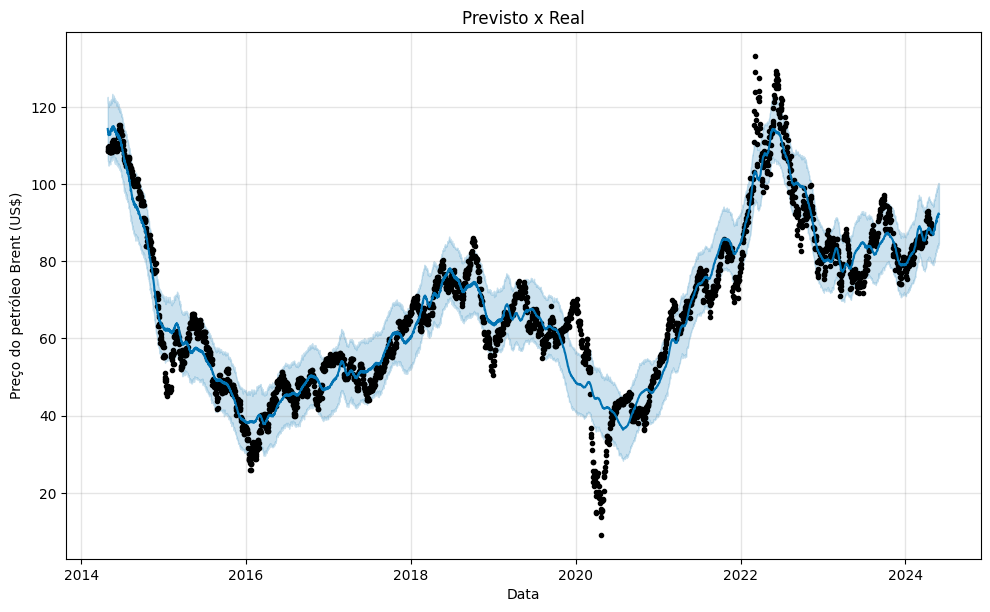

In [60]:
fig1 = m2.plot(forecast2)
plt.title('Previsto x Real')
plt.xlabel('Data')
plt.ylabel('Preço do petróleo Brent (US$)')

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:351: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:354: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array

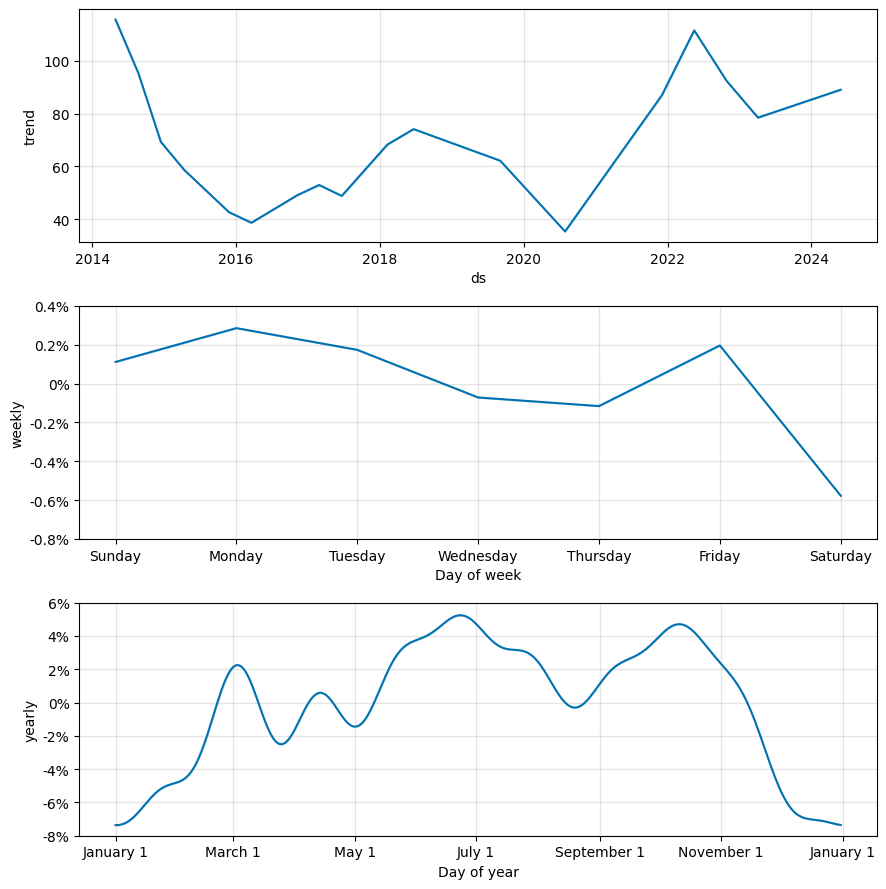

In [61]:
fig2 = m2.plot_components(forecast2)

In [62]:
plot_plotly(m2, forecast2)

In [63]:
plot_components_plotly(m2, forecast2)

### Avaliando o Modelo (modelo-2)

In [64]:
df_anp_range_10_anos_prophet_cv = cross_validation(m2, initial='730 days', period='180 days', horizon = '30 days')

  0%|          | 0/17 [00:00<?, ?it/s]

08:33:31 - cmdstanpy - INFO - Chain [1] start processing
08:33:31 - cmdstanpy - INFO - Chain [1] done processing
08:33:32 - cmdstanpy - INFO - Chain [1] start processing
08:33:32 - cmdstanpy - INFO - Chain [1] done processing
08:33:32 - cmdstanpy - INFO - Chain [1] start processing
08:33:33 - cmdstanpy - INFO - Chain [1] done processing
08:33:33 - cmdstanpy - INFO - Chain [1] start processing
08:33:33 - cmdstanpy - INFO - Chain [1] done processing
08:33:34 - cmdstanpy - INFO - Chain [1] start processing
08:33:34 - cmdstanpy - INFO - Chain [1] done processing
08:33:35 - cmdstanpy - INFO - Chain [1] start processing
08:33:35 - cmdstanpy - INFO - Chain [1] done processing
08:33:36 - cmdstanpy - INFO - Chain [1] start processing
08:33:37 - cmdstanpy - INFO - Chain [1] done processing
08:33:37 - cmdstanpy - INFO - Chain [1] start processing
08:33:39 - cmdstanpy - INFO - Chain [1] done processing
08:33:39 - cmdstanpy - INFO - Chain [1] start processing
08:33:40 - cmdstanpy - INFO - Chain [1]

In [65]:
df_anp_range_10_anos_prophet_cv.sort_values("ds", ascending=False)

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
396,2024-04-29,85.636145,77.790154,93.104382,88.44,2024-03-30
395,2024-04-26,85.486281,77.903650,93.950577,89.95,2024-03-30
394,2024-04-25,85.250179,77.724696,93.053091,88.10,2024-03-30
393,2024-04-24,85.322121,77.314158,93.027047,89.02,2024-03-30
392,2024-04-23,85.585382,77.230803,94.056209,88.29,2024-03-30
...,...,...,...,...,...,...
4,2016-05-16,46.132280,43.727861,48.478739,47.05,2016-05-11
3,2016-05-15,46.109929,43.859346,48.355497,46.43,2016-05-11
2,2016-05-14,46.006330,43.661892,48.305532,46.08,2016-05-11
1,2016-05-13,46.031485,43.799568,48.190712,44.01,2016-05-11


In [85]:
performance2 = performance_metrics(df_anp_range_10_anos_prophet_cv)
performance2.head(30)

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,3 days,46.596682,6.826176,5.128924,0.172943,0.062057,0.119466,0.487179
1,4 days,33.005314,5.745025,4.468433,0.129286,0.061487,0.102157,0.551282
2,5 days,31.502814,5.612737,4.561459,0.106581,0.062057,0.090452,0.573260
3,6 days,34.367712,5.862398,4.987406,0.093191,0.070215,0.085338,0.448718
4,7 days,38.193174,6.180063,5.314241,0.098339,0.065861,0.090078,0.435897
5,8 days,41.018573,6.404574,5.393790,0.113876,0.065384,0.099668,0.402930
6,9 days,44.209451,6.649019,5.640910,0.126231,0.065384,0.109170,0.424063
7,10 days,46.105791,6.790124,5.917953,0.122184,0.072759,0.108799,0.360947
8,11 days,49.448674,7.031975,6.268121,0.121862,0.074780,0.110732,0.280220
9,12 days,53.148361,7.290292,6.455388,0.115957,0.079677,0.106935,0.318681


c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:546: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:547: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



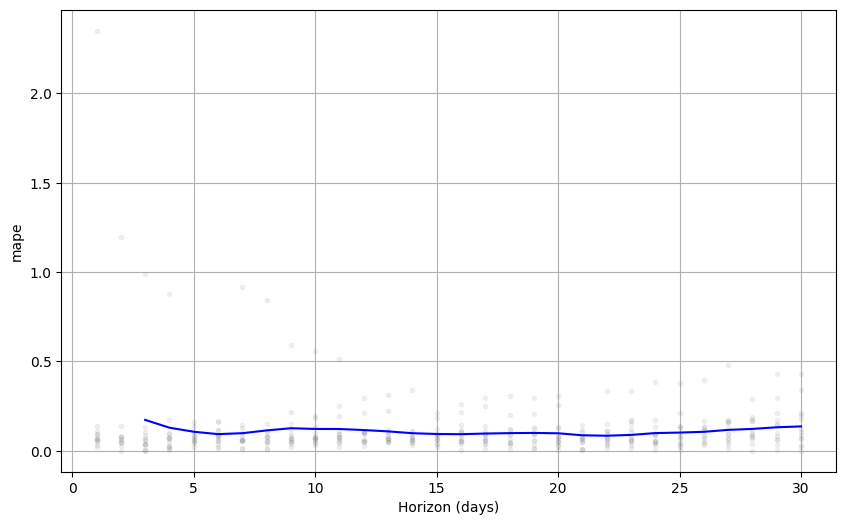

In [67]:
fig = plot_cross_validation_metric(df_anp_range_10_anos_prophet_cv, metric='mape', rolling_window=0.1)


### Prophet - testando o modelo sem o periodo da pandemia (modelo-3)

In [68]:
df_anp_prophet_rename = df_anp.rename(columns={'Data': 'ds', 'Preço petróleo Brent': 'y'})
df_anp_prophet3 =df_anp_prophet_rename[["ds","y"]]
df_anp_prophet3.head()

,ds,y
0,1987-05-20,18.63
1,1987-05-21,18.45
2,1987-05-22,18.55
5,1987-05-25,18.60
6,1987-05-26,18.63


In [69]:
# Selecionei um intervalo começamdo em 2014-01-01 e pulando um range de ('2021-03-20', '2023-05-05') para rodar o modelo-3
df_anp_prophet3 = df_anp_prophet3.loc[(~df_anp_prophet3['ds'].isin(date_range(start='2021-03-20', end='2023-05-05')))]
df_anp_prophet3.tail()


,ds,y
13488,2024-04-23,88.29
13489,2024-04-24,89.02
13490,2024-04-25,88.10
13491,2024-04-26,89.95
13494,2024-04-29,88.44


In [70]:
df_anp_prophet3.shape

(10617, 2)

In [71]:
m3 = Prophet()
m3.fit(df_anp_prophet3)


08:33:58 - cmdstanpy - INFO - Chain [1] start processing
08:34:16 - cmdstanpy - INFO - Chain [1] done processing


In [72]:
future3 = m3.make_future_dataframe(periods=120)
future3.tail()

,ds
10732,2024-08-23
10733,2024-08-24
10734,2024-08-25
10735,2024-08-26
10736,2024-08-27


In [73]:
forecast3 = m3.predict(future3)
forecast3[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,1987-05-20,17.123935,4.812068,29.707843
1,1987-05-21,17.254440,4.682739,29.087918
2,1987-05-22,17.238925,4.824872,29.793466
3,1987-05-25,17.244013,5.013536,30.503112
4,1987-05-26,17.205275,5.226207,29.955605
...,...,...,...,...
10732,2024-08-23,78.745524,66.607593,90.483349
10733,2024-08-24,79.186038,67.939410,91.465185
10734,2024-08-25,78.583744,65.877664,91.229021
10735,2024-08-26,78.821136,66.934253,91.305589


In [74]:
forecast3 = m3.predict(future3)
forecast3[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
10732,2024-08-23,78.745524,65.974092,91.843072
10733,2024-08-24,79.186038,66.846483,92.488376
10734,2024-08-25,78.583744,65.763332,90.657587
10735,2024-08-26,78.821136,66.325531,91.821049
10736,2024-08-27,78.811617,65.944399,91.174126


In [75]:
forecast3.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
10732,2024-08-23,77.025200,65.974092,91.843072,77.025200,77.070670,1.720324,1.720324,1.720324,-0.010326,-0.010326,-0.010326,1.730650,1.730650,1.730650,0.0,0.0,0.0,78.745524
10733,2024-08-24,77.033710,66.846483,92.488376,77.033710,77.086695,2.152329,2.152329,2.152329,0.400651,0.400651,0.400651,1.751678,1.751678,1.751678,0.0,0.0,0.0,79.186038
10734,2024-08-25,77.042219,65.763332,90.657587,77.037560,77.103788,1.541525,1.541525,1.541525,-0.231094,-0.231094,-0.231094,1.772619,1.772619,1.772619,0.0,0.0,0.0,78.583744
10735,2024-08-26,77.050729,66.325531,91.821049,77.042520,77.123619,1.770407,1.770407,1.770407,-0.022465,-0.022465,-0.022465,1.792872,1.792872,1.792872,0.0,0.0,0.0,78.821136
10736,2024-08-27,77.059238,65.944399,91.174126,77.048239,77.141587,1.752379,1.752379,1.752379,-0.059454,-0.059454,-0.059454,1.811833,1.811833,1.811833,0.0,0.0,0.0,78.811617


c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



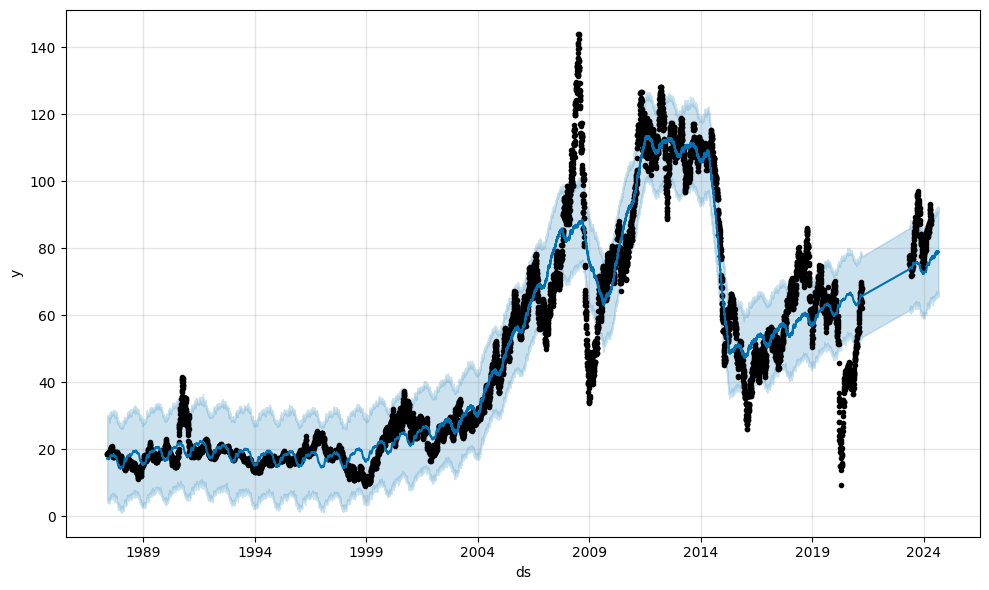

In [76]:
fig1 = m3.plot(forecast3)

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:351: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:354: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array

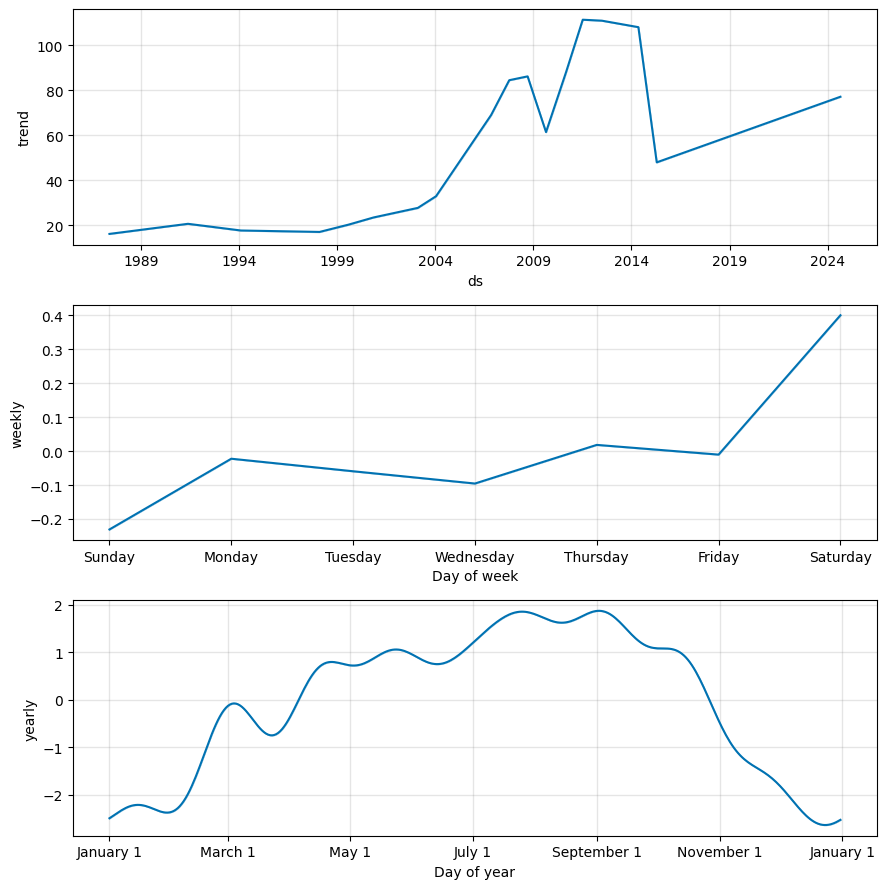

In [77]:
fig2 = m3.plot_components(forecast3)



In [78]:
plot_plotly(m3, forecast3)

In [79]:
plot_components_plotly(m, forecast3)



### Avaliando o Modelo (modelo-3)


In [80]:
df_anp_prophet3 = cross_validation(m3, initial='730 days', period='180 days', horizon = '30 days')

  0%|          | 0/67 [00:00<?, ?it/s]

08:34:27 - cmdstanpy - INFO - Chain [1] start processing
08:34:27 - cmdstanpy - INFO - Chain [1] done processing
08:34:28 - cmdstanpy - INFO - Chain [1] start processing
08:34:28 - cmdstanpy - INFO - Chain [1] done processing
08:34:28 - cmdstanpy - INFO - Chain [1] start processing
08:34:28 - cmdstanpy - INFO - Chain [1] done processing
08:34:29 - cmdstanpy - INFO - Chain [1] start processing
08:34:29 - cmdstanpy - INFO - Chain [1] done processing
08:34:29 - cmdstanpy - INFO - Chain [1] start processing
08:34:30 - cmdstanpy - INFO - Chain [1] done processing
08:34:30 - cmdstanpy - INFO - Chain [1] start processing
08:34:30 - cmdstanpy - INFO - Chain [1] done processing
08:34:31 - cmdstanpy - INFO - Chain [1] start processing
08:34:31 - cmdstanpy - INFO - Chain [1] done processing
08:34:31 - cmdstanpy - INFO - Chain [1] start processing
08:34:32 - cmdstanpy - INFO - Chain [1] done processing
08:34:32 - cmdstanpy - INFO - Chain [1] start processing
08:34:33 - cmdstanpy - INFO - Chain [1]

In [81]:
df_anp_prophet3.head()


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,1989-08-07,16.669855,15.941931,17.350658,16.05,1989-08-04
1,1989-08-08,16.595378,15.854295,17.292765,16.28,1989-08-04
2,1989-08-09,16.556413,15.827853,17.192317,16.45,1989-08-04
3,1989-08-10,16.521570,15.841072,17.234234,16.93,1989-08-04
4,1989-08-11,16.454860,15.764441,17.142969,17.00,1989-08-04


In [82]:
performance3 = performance_metrics(df_anp_prophet3)
performance3.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,4 days,285.114103,16.885322,11.633747,0.216622,0.152815,0.212152,0.432504
1,5 days,281.913188,16.790271,11.574125,0.218056,0.154296,0.213992,0.423246
2,6 days,279.339066,16.713440,11.522730,0.218241,0.153274,0.212534,0.421798
3,7 days,283.425495,16.835246,11.566389,0.216092,0.150541,0.210759,0.435464
4,8 days,289.665131,17.019551,11.739751,0.217802,0.149235,0.212020,0.422619


c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:546: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:547: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



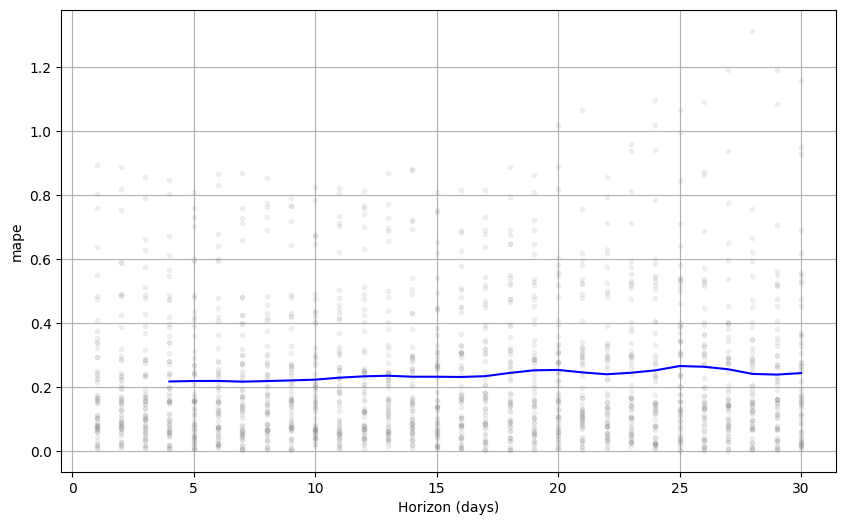

In [83]:
fig = plot_cross_validation_metric(df_anp_prophet3, metric='mape')

### Salvando o Modelo

In [84]:
joblib.dump(m3, 'modelo_prophet.pkl') # salvando o modelo

['modelo_prophet.pkl']

#### O modelo 2 foi o melhor modelo